In [49]:
########################################################################################################################
#
# Script name               - Energy_Prediction_EDA.ipynb
# Script description        - 
# Usage                     - 
# Input Params needed       - 
#
#
#  Date                        Author                        Modification                       Description
# =====                       =======                        =============                     =============
# 29-Oct-2019                 Singapore_rockers             Created
#
#
########################################################################################################################


## Competition Objective:

Energy savings is one of the important area of focus our current world. Energy savings has two key elements:

Forecasting future energy usage without improvements
Forecasting energy use after a specific set of improvements have been implemented
Once we have implemented a set of improvements, the value of energy efficiency improvements can be challenging as 
there's no way to truly know how much energy a building would have used without the improvements. 
his competition challenges you to build these counterfactual models across four energy types (chilled water, electricity, hot water, and steam) 
based on historic usage rates and observed weather.


In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import gc
import missingno

warnings.simplefilter('ignore')
matplotlib.rcParams['figure.dpi'] = 100
sns.set()
%matplotlib inline

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')
import gc


# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import matplotlib.patches as patches
from scipy import stats
from scipy.stats import skew

from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
pd.set_option('max_columns', 100)

py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go

import os,random, math, psutil, pickle
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import mean_squared_error
import lightgbm as lgb
from sklearn.model_selection import KFold, StratifiedKFold
from tqdm import tqdm

## Load the datasets

In [19]:
building = pd.read_csv('data/building_metadata.csv')
weather_train = pd.read_csv('data/weather_train.csv',parse_dates=['timestamp'])
weather_test = pd.read_csv('data/weather_test.csv',parse_dates=['timestamp'])
train = pd.read_csv('data/train.csv',parse_dates=['timestamp'])
test = pd.read_csv('data/test.csv',parse_dates=['timestamp'])

## Merging building and transaction data 

In [20]:
train = train.merge(building, on='building_id', how='left')
test = test.merge(building, on='building_id', how='left')

train = train.merge(weather_train, on=['site_id', 'timestamp'], how='left')
test = test.merge(weather_test, on=['site_id', 'timestamp'], how='left')

del weather_train, weather_test,building
gc.collect();

In [21]:
train.columns

Index(['building_id', 'meter', 'timestamp', 'meter_reading', 'site_id',
       'primary_use', 'square_feet', 'year_built', 'floor_count',
       'air_temperature', 'cloud_coverage', 'dew_temperature',
       'precip_depth_1_hr', 'sea_level_pressure', 'wind_direction',
       'wind_speed'],
      dtype='object')

## Create data & time feature for Data Analysis

In [26]:
def add_date_fields(df,timestamp_fld):
    df['month_datetime'] = df[timestamp_fld].dt.month.astype(np.int8)
    df['weekofyear_datetime'] = df[timestamp_fld].dt.weekofyear.astype(np.int8)
    df['dayofyear_datetime'] = df[timestamp_fld].dt.dayofyear.astype(np.int16)
    df['hour_datetime'] = df[timestamp_fld].dt.hour.astype(np.int8)  
    df['day_week'] = df[timestamp_fld].dt.dayofweek.astype(np.int8)
    df['day_month_datetime'] = df[timestamp_fld].dt.day.astype(np.int8)
    df['week_month_datetime'] = df[timestamp_fld].dt.day/7
    return df

In [27]:
train.dtypes

building_id                     int64
meter                           int64
timestamp              datetime64[ns]
meter_reading                 float64
site_id                         int64
primary_use                    object
square_feet                     int64
year_built                    float64
floor_count                   float64
air_temperature               float64
cloud_coverage                float64
dew_temperature               float64
precip_depth_1_hr             float64
sea_level_pressure            float64
wind_direction                float64
wind_speed                    float64
month_datetime                   int8
weekofyear_datetime              int8
dayofyear_datetime              int16
hour_datetime                    int8
day_week                         int8
day_month_datetime               int8
week_month_datetime           float64
dtype: object

In [ ]:
train = add_date_fields(train,timestamp_fld='timestamp')
test = add_date_fields(train,timestamp_fld='timestamp')

In [28]:
test = add_date_fields(test,timestamp_fld='timestamp')

In [30]:
test.dtypes

row_id                          int64
building_id                     int64
meter                           int64
timestamp              datetime64[ns]
site_id                         int64
primary_use                    object
square_feet                     int64
year_built                    float64
floor_count                   float64
air_temperature               float64
cloud_coverage                float64
dew_temperature               float64
precip_depth_1_hr             float64
sea_level_pressure            float64
wind_direction                float64
wind_speed                    float64
month_datetime                   int8
weekofyear_datetime              int8
dayofyear_datetime              int16
hour_datetime                    int8
day_week                         int8
day_month_datetime               int8
week_month_datetime           float64
dtype: object

## Mean meter reading by Day 

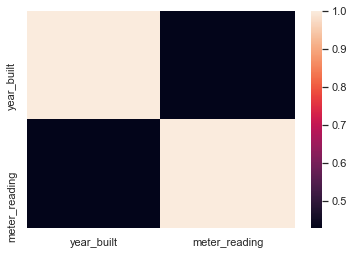

In [42]:
sns.heatmap(train.groupby(['year_built']).agg({'meter_reading':'sum'}).reset_index().corr())

## First thing first - ☝️  Analyse the Target variable 

count    2.021610e+07
mean     2.117121e+03
std      1.532356e+05
min      0.000000e+00
25%      1.830000e+01
50%      7.877500e+01
75%      2.679840e+02
max      2.190470e+07
Name: meter_reading, dtype: float64

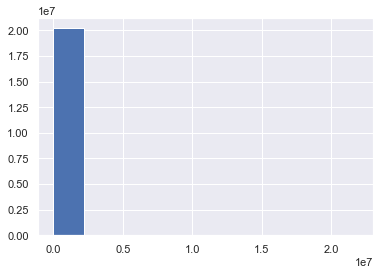

In [46]:
ax = train['meter_reading'].hist()
train.meter_reading.describe()

## Observation : Target variable is highly skewed ,Need to take the logarithm to make it normally distributed 

count    2.021610e+07
mean     2.117121e+03
std      1.532356e+05
min      0.000000e+00
25%      1.830000e+01
50%      7.877500e+01
75%      2.679840e+02
max      2.190470e+07
Name: meter_reading, dtype: float64

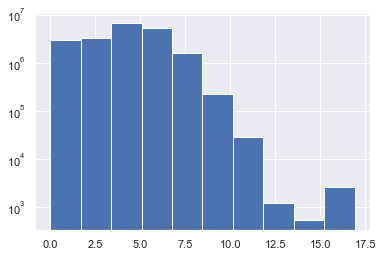

In [48]:
ax = np.log1p(train['meter_reading']).hist()
ax.set_yscale('log')
train.meter_reading.describe()

## Let see the distribution of target variable 

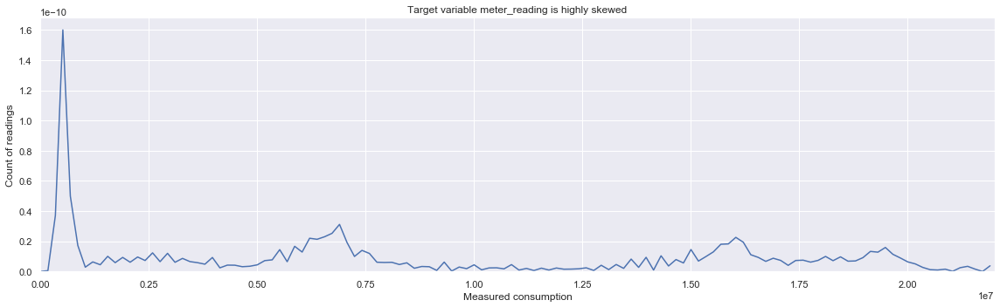

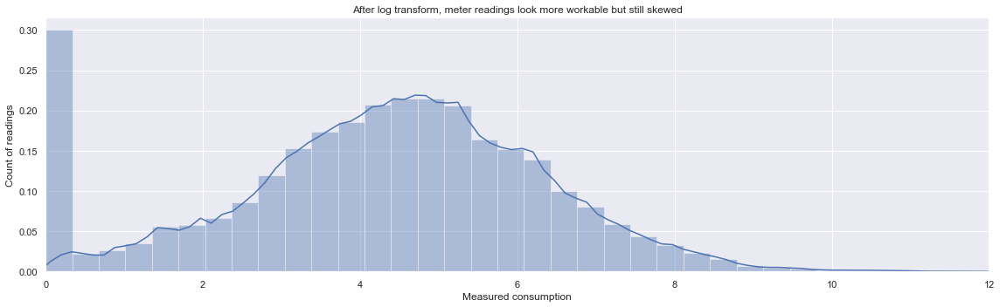

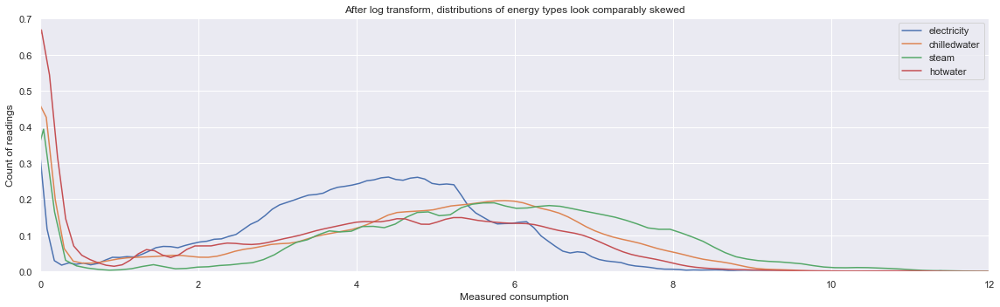

In [85]:
energy_types_dict = {0: "electricity", 1: "chilledwater", 2: "steam", 3: "hotwater"}
energy_types      = ['electricity', 'chilledwater', 'steam', 'hotwater']


plt.figure(figsize=(16,5))
sns.distplot(train.meter_reading, hist=False)
plt.title(f"Target variable meter_reading is highly skewed")
plt.ylabel("Count of readings")
plt.xlabel(f"Measured consumption")
plt.xlim(0, train.meter_reading.max() + 100_000)
plt.tight_layout()
plt.show()

plt.figure(figsize=(16,5))
sns.distplot(np.log1p(train.meter_reading))
plt.title(f"After log transform, meter readings look more workable but still skewed")
plt.ylabel("Count of readings")
plt.xlabel(f"Measured consumption")
plt.xlim(0, 12)
plt.tight_layout()
plt.show()

plt.figure(figsize=(16,5))
for idx in range(0,4):
    sns.distplot(np.log1p(train[train.meter==idx].meter_reading), hist=False, label=energy_types[idx])
plt.title(f"After log transform, distributions of energy types look comparably skewed")
plt.ylabel("Count of readings")
plt.xlabel(f"Measured consumption")
plt.legend()
plt.xlim(0, 12)
plt.tight_layout()
plt.show()

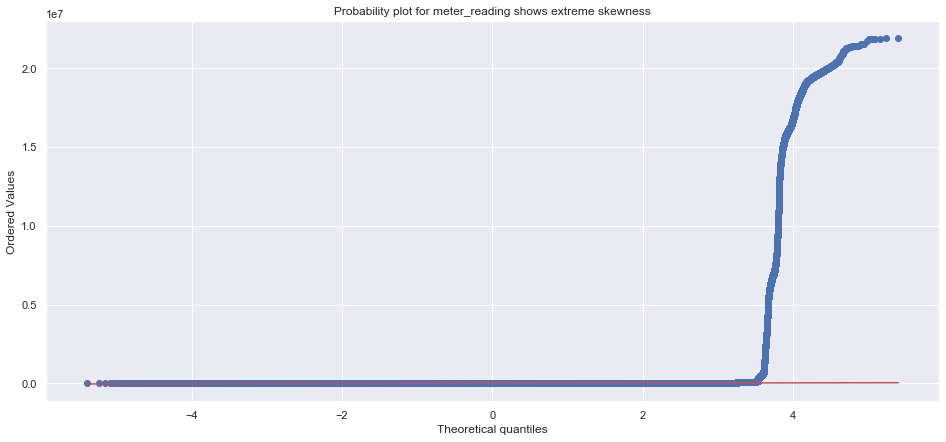

In [86]:
plt.figure(figsize=(16,7))
_ = stats.probplot(train['meter_reading'], plot=plt)
plt.title("Probability plot for meter_reading shows extreme skewness")
plt.show()

## Lets check missing data

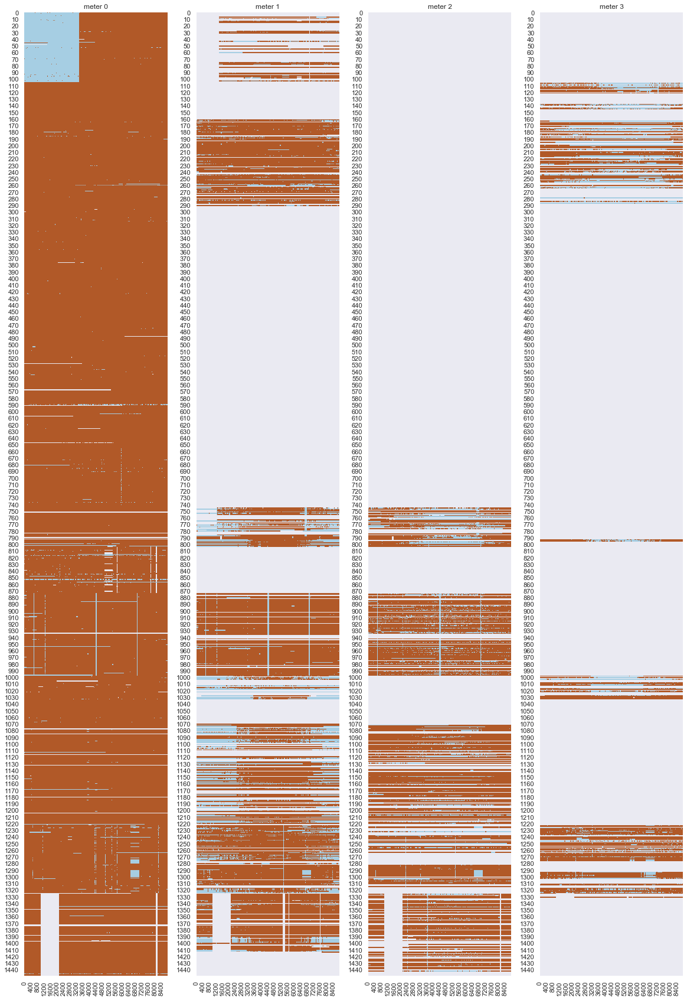

In [87]:
# Load data
train_cht = train.set_index(['timestamp'])

# Plot missing values per building/meter
f,a=plt.subplots(1,4,figsize=(20,30))
for meter in np.arange(4):
    df = train_cht[train_cht.meter==meter].copy().reset_index()
    df['timestamp'] = pd.to_timedelta(df.timestamp).dt.total_seconds() / 3600
    df['timestamp'] = df.timestamp.astype(int)
    df.timestamp -= df.timestamp.min()
    missmap = np.empty((1449, df.timestamp.max()+1))
    missmap.fill(np.nan)
    for l in df.values:
        if l[2]!=meter:continue
        missmap[int(l[1]), int(l[0])] = 0 if l[3]==0 else 1
    a[meter].set_title(f'meter {meter:d}')
    sns.heatmap(missmap, cmap='Paired', ax=a[meter], cbar=False)

## Seasonal pattern of energy consuption by sites

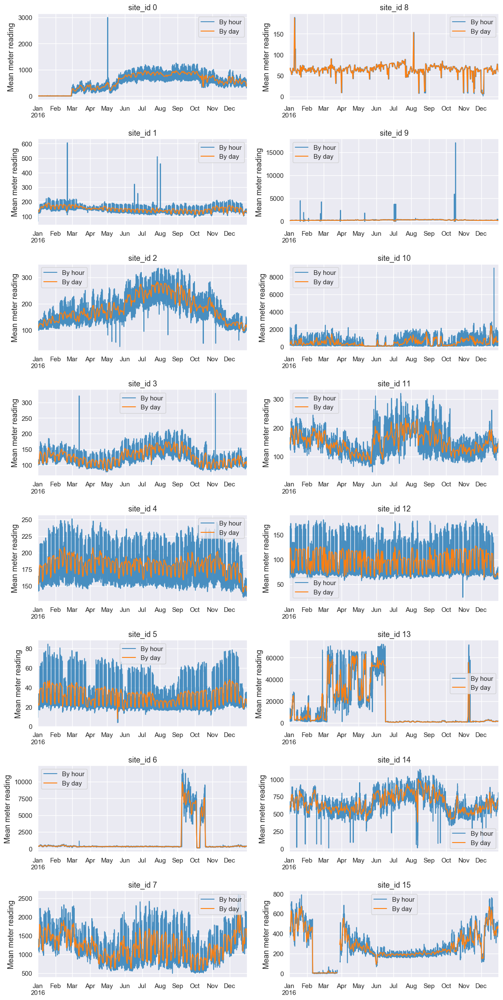

In [43]:
## Refered from "EDA for ASHRAE" kernal 

fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)
for i in range(train['site_id'].nunique()):
    train[train['site_id'] == i][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes[i%8][i//8], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    train[train['site_id'] == i][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading'].plot(ax=axes[i%8][i//8], alpha=1, label='By day', color='tab:orange').set_xlabel('');
    axes[i%8][i//8].legend();
    axes[i%8][i//8].set_title('site_id {}'.format(i), fontsize=13);
    plt.subplots_adjust(hspace=0.45)

# Observation : 

Based on the above pattern based on the site , May - Sep there is surge in energy consumption , Some sites is not in operational in some period 

## Train & Test for year built 

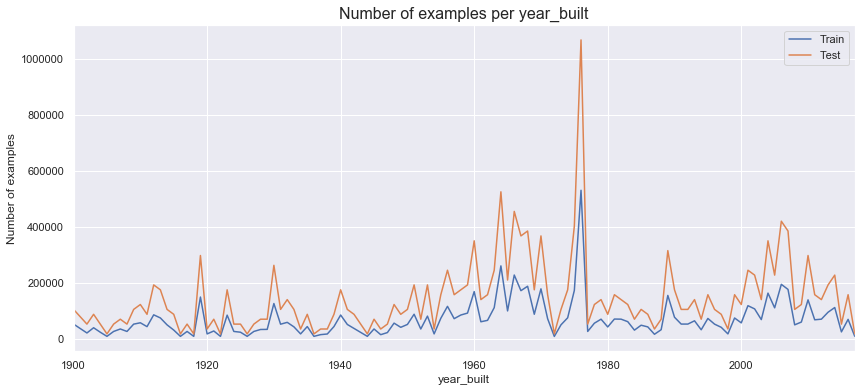

In [44]:
fig, axes = plt.subplots(1,1,figsize=(14, 6))
train['year_built'].value_counts(dropna=False).sort_index().plot(ax=axes).set_xlabel('year_built');
test['year_built'].value_counts(dropna=False).sort_index().plot(ax=axes).set_ylabel('Number of examples');
axes.legend(['Train', 'Test']);
axes.set_title('Number of examples per year_built', fontsize=16);

## Temprature distribution over time

In [50]:
from bokeh.models import Panel, Tabs
from bokeh.io import output_notebook, show
from bokeh.plotting import figure

In [54]:
## Nice Post from SRK 

output_notebook()

def get_plots(df, col, color):
    p = figure(plot_width=1000, plot_height=350, x_axis_type="datetime", title=f"{col} distribution over time")
    p.line(df['timestamp'], df[col], color=color, alpha=0.5)
    return p

col_map = {
    "dew_temperature": "Dew Temperature",
    "sea_level_pressure": "Sea Level Pressure",
    "wind_speed": "Wind Speed",
    "cloud_coverage": "Cloud Coverage",
}

color_map = {
    "dew_temperature": "brown",
    "sea_level_pressure": "green",
    "wind_speed": "red",
    "cloud_coverage": "blue",
}

main_tabs_list = []
cols = ["dew_temperature", "sea_level_pressure", "wind_speed", "cloud_coverage"]
for col in cols:
    tab_list = []
    for site in range(16):
        temp_df = weather_train[weather_train["site_id"]==site]
        p = get_plots(temp_df, col, color_map[col])
        tab = Panel(child=p, title=f"Site:{site}")
        tab_list.append(tab)
    tabs = Tabs(tabs=tab_list)
    panel = Panel(child=tabs, title=col_map[col])
    main_tabs_list.append(panel)

tabs = Tabs(tabs=main_tabs_list)
show(tabs)

Loading BokehJS ...

## Average meter reading by day & hour 

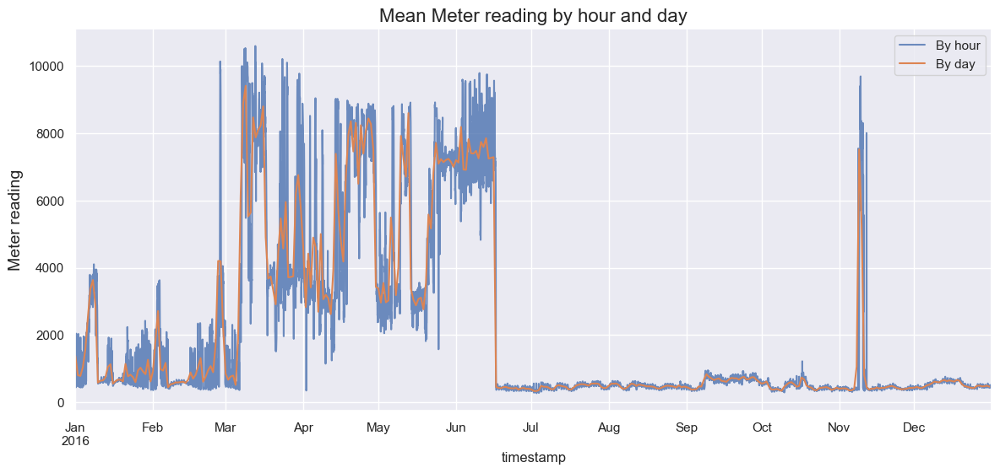

In [58]:
fig, axes = plt.subplots(1, 1, figsize=(14, 6), dpi=100)
train[['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading'].plot(ax=axes, label='By hour', alpha=0.8).set_ylabel('Meter reading', fontsize=14);
train[['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading'].plot(ax=axes, label='By day', alpha=1).set_ylabel('Meter reading', fontsize=14);
axes.set_title('Mean Meter reading by hour and day', fontsize=16);
axes.legend();

In [69]:
train.columns

Index(['building_id', 'meter', 'timestamp', 'meter_reading', 'site_id',
       'primary_use', 'square_feet', 'year_built', 'floor_count',
       'air_temperature', 'cloud_coverage', 'dew_temperature',
       'precip_depth_1_hr', 'sea_level_pressure', 'wind_direction',
       'wind_speed', 'month_datetime', 'weekofyear_datetime',
       'dayofyear_datetime', 'hour_datetime', 'day_week', 'day_month_datetime',
       'week_month_datetime'],
      dtype='object')

In [72]:
train_meter = train.groupby(['meter','month_datetime']).agg({'meter_reading':'mean'}).reset_index()

In [81]:
def Meter_reading_meter_type():
    for i in range(train_meter['meter'].max()):      
        plt.title('Energy Consumption by '+ str(i))
        plt.bar(train_meter[train_meter['meter']==i].month_datetime,train_meter[train_meter['meter']==i].meter_reading)
        plt.ylabel('Energy Consumption (kWh)')
        plt.xlabel('Months')

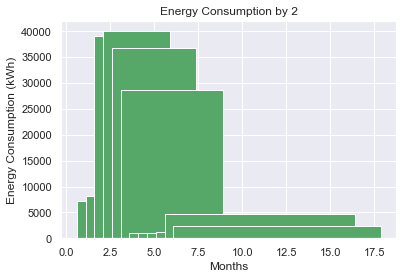

In [82]:
Meter_reading_meter_type()

In [77]:
train_meter['meter'].max()

3

In [64]:
months_df = train.copy()
months_df['month'] = train.index
#months_df['month'] = months_df['month'].dt.month
months_reading = months_df.groupby(['month','meter'])['meter_reading'].mean()

In [ ]:
meter_type_consumption(months_reading,['electricity','chilledwater','steam','hotwater'])